In [187]:
import pandas as pd
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_curve, roc_auc_score, plot_confusion_matrix
from sklearn.naive_bayes import GaussianNB

from sklearn.tree import DecisionTreeClassifier, plot_tree, export_graphviz
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler, StandardScaler,LabelEncoder 
import matplotlib.pyplot as plt
import numpy as np
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, GridSearchCV
from ipywidgets import interactive

from sklearn import metrics

from IPython.display import display 

In [188]:
df = pd.read_csv("/Users/admin/Desktop/IP_projekat/weatherAUS.csv")


In [3]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [4]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


In [235]:
normalni_df= pd.read_csv("/Users/admin/Desktop/IP_projekat/weatherAUS.csv")

In [236]:
normalni_df.dropna(subset=['RainToday', 'RainTomorrow'], inplace=True)
normalni_df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145454,2017-06-20,Uluru,3.5,21.8,0.0,NaN,NaN,E,31.0,ESE,...,59.0,27.0,1024.7,1021.2,NaN,NaN,9.4,20.9,No,No
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No


Text(0, 0.5, 'Humidity9am')

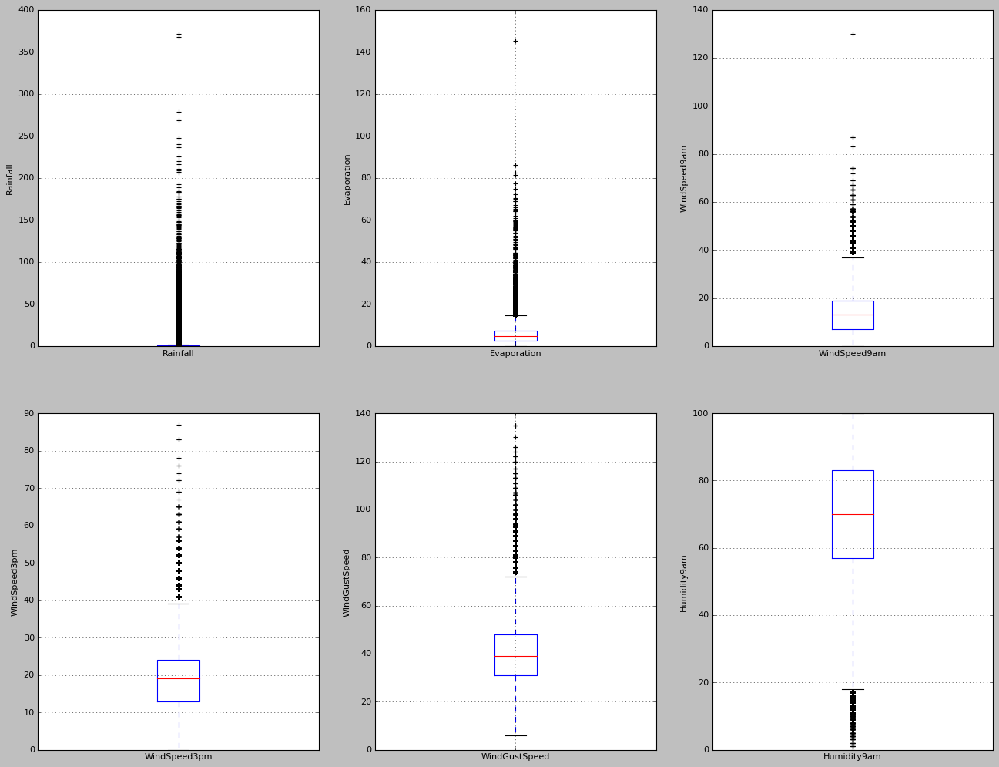

In [157]:

plt.figure(figsize=(20,15))


plt.subplot(2, 3, 1)
fig = df.boxplot(column='Rainfall')
fig.set_title('')
fig.set_ylabel('Rainfall')


plt.subplot(2, 3, 2)
fig = df.boxplot(column='Evaporation')
fig.set_title('')
fig.set_ylabel('Evaporation')


plt.subplot(2, 3, 3)
fig = df.boxplot(column='WindSpeed9am')
fig.set_title('')
fig.set_ylabel('WindSpeed9am')


plt.subplot(2, 3, 4)
fig = df.boxplot(column='WindSpeed3pm')
fig.set_title('')
fig.set_ylabel('WindSpeed3pm')



plt.subplot(2, 3, 5)
fig = df.boxplot(column='WindGustSpeed')
fig.set_title('')
fig.set_ylabel('WindGustSpeed')


plt.subplot(2, 3, 6)
fig = df.boxplot(column='Humidity9am')
fig.set_title('')
fig.set_ylabel('Humidity9am')


In [250]:
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

In [251]:

sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 16
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#FFFFFF' 

In [252]:
px.histogram(normalni_df, x='MinTemp', 
           y='MaxTemp', 
           color='RainToday')

In [253]:
px.histogram(normalni_df, x='Location', 
             title='Padanje kise u zavisnost od lokacije', 
             color='RainTomorrow')

In [254]:
px.histogram(normalni_df, x='Location', 
             title='Padanje kise u zavisnost od lokacije', 
             color='RainToday')

In [163]:

kategoricke = [atribut for atribut in df.columns if df[atribut].dtype=='O']

print('Ukupno ima {} kategorickih atributa\n'.format(len(kategoricke)))

print('Kategoricki atributi :', kategoricke)

Ukupno ima 7 kategorickih atributa

Kategoricki atributi : ['Date', 'Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


In [164]:
df[kategoricke].isnull().sum()

Date                0
Location            0
WindGustDir     10326
WindDir9am      10566
WindDir3pm       4228
RainToday        3261
RainTomorrow     3267
dtype: int64

In [166]:
for atribut in kategoricke:
    
    print(atribut, ' sadrzi ', len(df[atribut].unique()), 'razlictih promenljivih')

Date  sadrzi  3436 razlictih promenljivih
Location  sadrzi  49 razlictih promenljivih
WindGustDir  sadrzi  17 razlictih promenljivih
WindDir9am  sadrzi  17 razlictih promenljivih
WindDir3pm  sadrzi  17 razlictih promenljivih
RainToday  sadrzi  3 razlictih promenljivih
RainTomorrow  sadrzi  3 razlictih promenljivih


In [198]:
df['Date'] = pd.to_datetime(df['Date'])

In [199]:
df['Month'] = df['Date'].dt.month


In [200]:
df['Year'] = df['Date'].dt.year

df['Year'].head()

6049    1970
6050    1970
6052    1970
6053    1970
6054    1970
Name: Year, dtype: int64

In [201]:
df.drop('Date', axis=1, inplace = True)

In [167]:
numericki = [atribut for atribut in df.columns if df[atribut].dtype!='O']

print('Ukupno ima {} numerickih atributa\n'.format(len(numericki)))

print('Numericki atributi:', numericki)

Ukupno ima 16 numerickih atributa

Numericki atributi: ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']


In [168]:
df[numericki].isnull().sum()

MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustSpeed    10263
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
dtype: int64

In [169]:
df[numericki].head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
0,13.4,22.9,0.6,NaN,NaN,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8
1,7.4,25.1,0.0,NaN,NaN,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3
2,12.9,25.7,0.0,NaN,NaN,46.0,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2
3,9.2,28.0,0.0,NaN,NaN,24.0,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5
4,17.5,32.3,1.0,NaN,NaN,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7


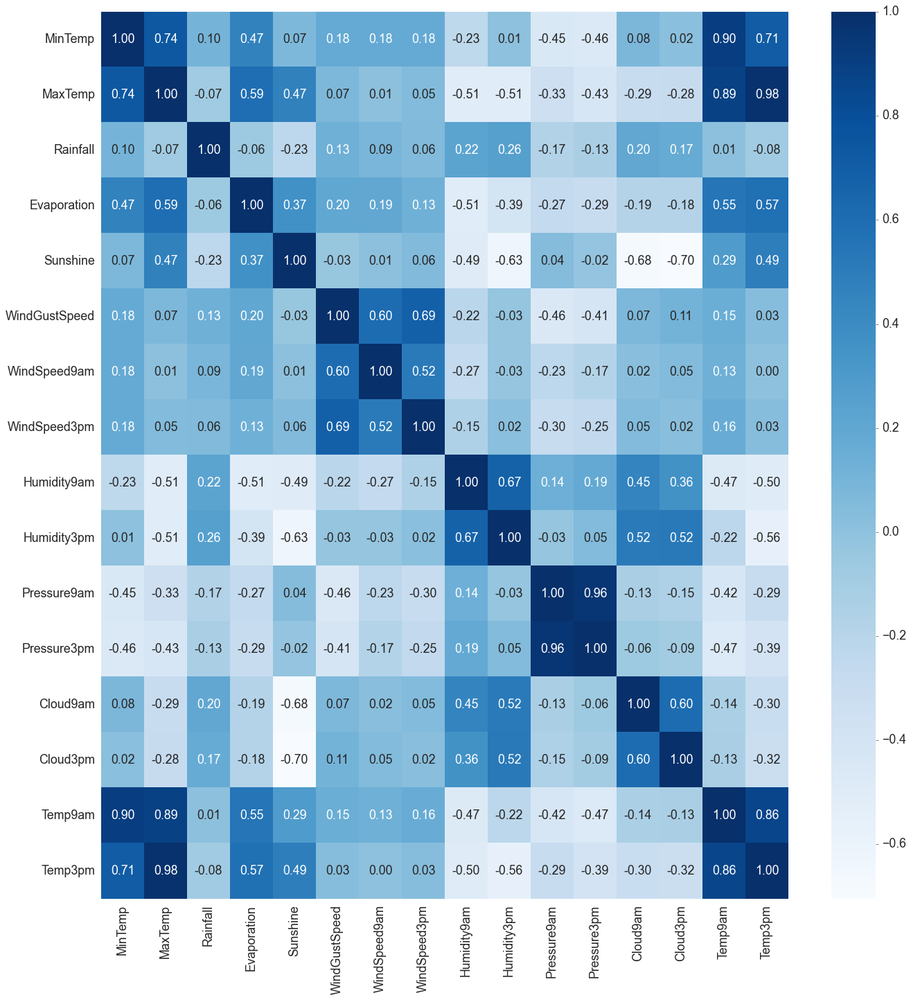

In [256]:

matrica_korelacije = normalni_df.corr()
plt.figure(figsize=(20,20))

g=sns.heatmap(matrica_korelacije,annot=True,cmap='Blues', fmt='.2f')

In [189]:
df.dropna(inplace=True)


In [190]:
df.isna().sum().sum()

0

In [9]:
df.head(10)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
6049,2009-01-01,Cobar,17.9,35.2,0.0,12.0,12.3,SSW,48.0,ENE,...,20.0,13.0,1006.3,1004.4,2.0,5.0,26.6,33.4,No,No
6050,2009-01-02,Cobar,18.4,28.9,0.0,14.8,13.0,S,37.0,SSE,...,30.0,8.0,1012.9,1012.1,1.0,1.0,20.3,27.0,No,No
6052,2009-01-04,Cobar,19.4,37.6,0.0,10.8,10.6,NNE,46.0,NNE,...,42.0,22.0,1012.3,1009.2,1.0,6.0,28.7,34.9,No,No
6053,2009-01-05,Cobar,21.9,38.4,0.0,11.4,12.2,WNW,31.0,WNW,...,37.0,22.0,1012.7,1009.1,1.0,5.0,29.1,35.6,No,No
6054,2009-01-06,Cobar,24.2,41.0,0.0,11.2,8.4,WNW,35.0,NW,...,19.0,15.0,1010.7,1007.4,1.0,6.0,33.6,37.6,No,No
6055,2009-01-07,Cobar,27.1,36.1,0.0,13.0,0.0,N,43.0,N,...,26.0,19.0,1007.7,1007.4,8.0,8.0,30.7,34.3,No,No
6056,2009-01-08,Cobar,23.3,34.0,0.0,9.8,12.6,SSW,41.0,S,...,33.0,15.0,1011.3,1009.9,3.0,1.0,25.0,31.5,No,No
6057,2009-01-09,Cobar,16.1,34.2,0.0,14.6,13.2,SE,37.0,SE,...,25.0,9.0,1013.3,1009.2,1.0,1.0,20.7,32.8,No,No
6058,2009-01-10,Cobar,19.0,35.5,0.0,12.0,12.3,ENE,48.0,ENE,...,46.0,28.0,1008.3,1004.0,1.0,5.0,23.4,33.3,No,No
6059,2009-01-11,Cobar,19.7,35.5,0.0,11.0,12.7,NE,41.0,NNE,...,61.0,14.0,1007.9,1005.8,1.0,5.0,24.0,33.6,No,No


In [191]:
y = df['RainTomorrow']

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 56420 entries, 6049 to 142302
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           56420 non-null  object 
 1   Location       56420 non-null  object 
 2   MinTemp        56420 non-null  float64
 3   MaxTemp        56420 non-null  float64
 4   Rainfall       56420 non-null  float64
 5   Evaporation    56420 non-null  float64
 6   Sunshine       56420 non-null  float64
 7   WindGustDir    56420 non-null  object 
 8   WindGustSpeed  56420 non-null  float64
 9   WindDir9am     56420 non-null  object 
 10  WindDir3pm     56420 non-null  object 
 11  WindSpeed9am   56420 non-null  float64
 12  WindSpeed3pm   56420 non-null  float64
 13  Humidity9am    56420 non-null  float64
 14  Humidity3pm    56420 non-null  float64
 15  Pressure9am    56420 non-null  float64
 16  Pressure3pm    56420 non-null  float64
 17  Cloud9am       56420 non-null  float64
 18  Cl

In [192]:
le = LabelEncoder()


In [49]:
import seaborn as sns


In [14]:
df.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
6049,17.9,35.2,0.0,12.0,SSW,48.0,ENE,SW,6.0,20.0,20.0,13.0,1006.3,1004.4,2.0,5.0,26.6,33.4,No,No
6050,18.4,28.9,0.0,14.8,S,37.0,SSE,SSE,19.0,19.0,30.0,8.0,1012.9,1012.1,1.0,1.0,20.3,27.0,No,No
6052,19.4,37.6,0.0,10.8,NNE,46.0,NNE,NNW,30.0,15.0,42.0,22.0,1012.3,1009.2,1.0,6.0,28.7,34.9,No,No
6053,21.9,38.4,0.0,11.4,WNW,31.0,WNW,WSW,6.0,6.0,37.0,22.0,1012.7,1009.1,1.0,5.0,29.1,35.6,No,No
6054,24.2,41.0,0.0,11.2,WNW,35.0,NW,WNW,17.0,13.0,19.0,15.0,1010.7,1007.4,1.0,6.0,33.6,37.6,No,No


In [193]:
df['RainTomorrow']= le.fit_transform(df['RainTomorrow'])
df['RainTomorrow']
y = df['RainTomorrow']

In [194]:
y

6049      0
6050      0
6052      0
6053      0
6054      0
         ..
142298    0
142299    0
142300    0
142301    0
142302    0
Name: RainTomorrow, Length: 56420, dtype: int64

In [203]:

cols = ['Location','WindDir9am', 'WindDir3pm', 'WindGustDir', 'RainToday']

df[cols] = df[cols].apply(LabelEncoder().fit_transform)

df.head()
x= df.drop('RainTomorrow', axis =1)
x

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Month,Year
6049,4,17.9,35.2,0.0,12.0,12.3,11,48.0,1,12,...,13.0,1006.3,1004.4,2.0,5.0,26.6,33.4,0,1,1970
6050,4,18.4,28.9,0.0,14.8,13.0,8,37.0,10,10,...,8.0,1012.9,1012.1,1.0,1.0,20.3,27.0,0,1,1970
6052,4,19.4,37.6,0.0,10.8,10.6,5,46.0,5,6,...,22.0,1012.3,1009.2,1.0,6.0,28.7,34.9,0,1,1970
6053,4,21.9,38.4,0.0,11.4,12.2,14,31.0,14,15,...,22.0,1012.7,1009.1,1.0,5.0,29.1,35.6,0,1,1970
6054,4,24.2,41.0,0.0,11.2,8.4,14,35.0,7,14,...,15.0,1010.7,1007.4,1.0,6.0,33.6,37.6,0,1,1970
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142298,6,19.3,33.4,0.0,6.0,11.0,1,35.0,9,4,...,32.0,1013.9,1010.5,0.0,1.0,24.5,32.3,0,1,1970
142299,6,21.2,32.6,0.0,7.6,8.6,0,37.0,9,9,...,28.0,1014.6,1011.2,7.0,0.0,24.8,32.0,0,1,1970
142300,6,20.7,32.8,0.0,5.6,11.0,0,33.0,0,13,...,23.0,1015.3,1011.8,0.0,0.0,24.8,32.1,0,1,1970
142301,6,19.5,31.8,0.0,6.2,10.6,2,26.0,9,6,...,58.0,1014.9,1010.7,1.0,1.0,24.8,29.2,0,1,1970


In [9]:
mmscaler = MinMaxScaler()

In [10]:
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size = 0.3)

In [11]:
x_train = pd.DataFrame(mmscaler.fit_transform(x_train))

In [12]:
x_test = pd.DataFrame(mmscaler.transform(x_test))

In [13]:
#Drvo odlucivanja
dt = DecisionTreeClassifier()
dt.fit(x_train,y_train)



DecisionTreeClassifier()

In [70]:
def class_info(clf, x_train, x_test, y_train, y_test, cv=False):
    

    if cv:
        print('Najbolji parametri', clf.best_params_)

        means = clf.cv_results_['mean_test_score']
        stds = clf.cv_results_['std_test_score']
        for mean, std, params in zip(means, stds, clf.cv_results_['params']):
            print("%0.3f (+/-%0.02f) za %s" % (mean, std * 2, params))
            

    

    print("##########################################")
    #Trening skup
    y_pred = clf.predict(x_train)
    print('Trening skup:')
    print("Matrica konfuzije")
    print(pd.DataFrame(confusion_matrix(y_train, y_pred)))

    print("##########################################")
    print('Izvestaj klasifikacije')
    print(classification_report(y_train, y_pred))
    print("##########################################")
    print('Preciznost')
    print(accuracy_score(y_train, y_pred))
    print("##########################################")
    lw=2
    metrics.plot_roc_curve(clf, x_train, y_train)
    plt.title('ROC kriva za trening skup')
    metrics.roc_auc_score(y_train, y_pred, average=None)
    plt.plot([0, 1], [0, 1], color='red', lw=lw, linestyle='--')



    #Test skup
    y_pred = clf.predict(x_test)
    print('Test skup:')
    print("Matrica konfuzije")
    print(pd.DataFrame(confusion_matrix(y_test, y_pred)))
    print("##########################################")
    print('Izvestaj klasifikacije')
    print(classification_report(y_test, y_pred))
    print("##########################################")
    print('Preciznost')
    print(accuracy_score(y_test, y_pred))
    print("##########################################")
    
    #ROC kriva
    lw=2
    print('ROC kriva')
    metrics.plot_roc_curve(clf, x_test, y_test)
    plt.title('ROC kriva za test skup')
    metrics.roc_auc_score(y_test, y_pred, average=None)
    plt.plot([0, 1], [0, 1], color='red', lw=lw, linestyle='--')


##########################################
Trening skup:
Matrica konfuzije
       0     1
0  30784     0
1      0  8710
##########################################
Izvestaj klasifikacije
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     30784
           1       1.00      1.00      1.00      8710

    accuracy                           1.00     39494
   macro avg       1.00      1.00      1.00     39494
weighted avg       1.00      1.00      1.00     39494

##########################################
Preciznost
1.0
##########################################
Test skup:
Matrica konfuzije
       0     1
0  10741  2468
1   1621  2096
##########################################
Izvestaj klasifikacije
              precision    recall  f1-score   support

           0       0.87      0.81      0.84     13209
           1       0.46      0.56      0.51      3717

    accuracy                           0.76     16926
   macro avg       0.66     

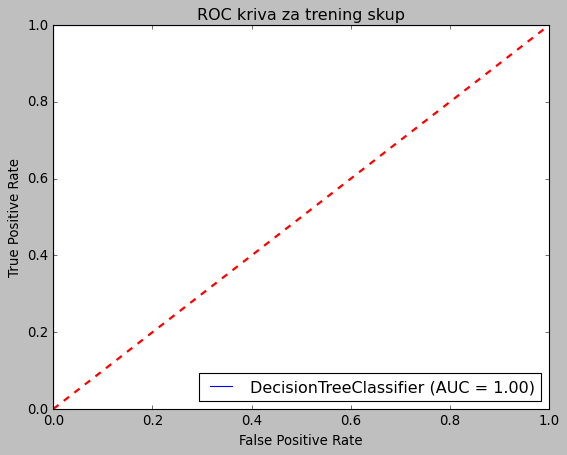

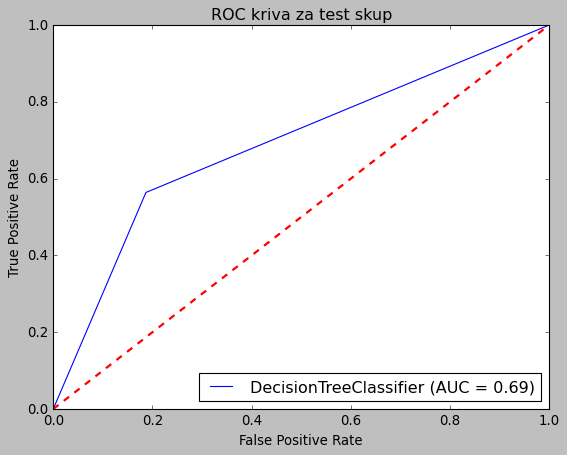

In [71]:
class_info(dt,x_train, x_test, y_train, y_test)


In [38]:
def preciznost(clf,x_test,y_test):
    y_pred = clf.predict(x_test)

    return accuracy_score(y_test,y_pred)

In [40]:

dt_accuracy = preciznost(dt,x_test,y_test)
dt_accuracy

0.7584190003544842

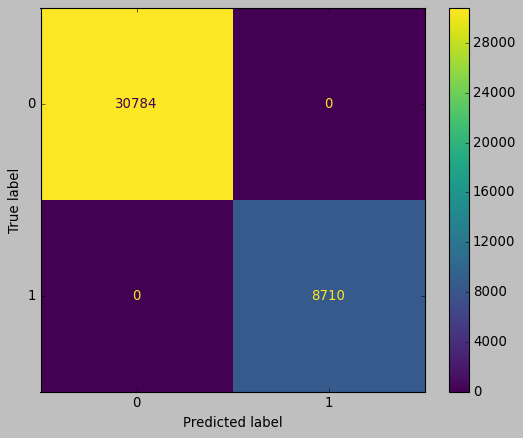

In [118]:
plot_confusion_matrix(dt, x_train, y_train)

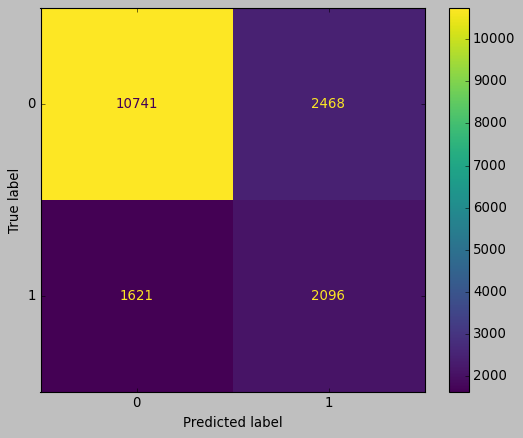

In [119]:
plot_confusion_matrix(dt, x_test, y_test)

In [43]:
#KNN
params_knn = {
    'n_neighbors':range(3,10),
    
    'weights':['uniform','distance'],
    'p':[1,2],
 
}

knn = KNeighborsClassifier()

clf_knn = GridSearchCV(knn, params_knn, cv =5)
clf_knn.fit(x_train, y_train)



GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': range(3, 10), 'p': [1, 2],
                         'weights': ['uniform', 'distance']})

In [44]:

knn_accuracy = preciznost(clf_knn,x_test,y_test)
knn_accuracy

0.8449131513647643

Najbolji parametri {'n_neighbors': 9, 'p': 1, 'weights': 'distance'}
0.826 (+/-0.003) za {'n_neighbors': 3, 'p': 1, 'weights': 'uniform'}
0.827 (+/-0.003) za {'n_neighbors': 3, 'p': 1, 'weights': 'distance'}
0.823 (+/-0.004) za {'n_neighbors': 3, 'p': 2, 'weights': 'uniform'}
0.823 (+/-0.004) za {'n_neighbors': 3, 'p': 2, 'weights': 'distance'}
0.832 (+/-0.002) za {'n_neighbors': 4, 'p': 1, 'weights': 'uniform'}
0.828 (+/-0.002) za {'n_neighbors': 4, 'p': 1, 'weights': 'distance'}
0.832 (+/-0.003) za {'n_neighbors': 4, 'p': 2, 'weights': 'uniform'}
0.824 (+/-0.005) za {'n_neighbors': 4, 'p': 2, 'weights': 'distance'}
0.834 (+/-0.003) za {'n_neighbors': 5, 'p': 1, 'weights': 'uniform'}
0.835 (+/-0.004) za {'n_neighbors': 5, 'p': 1, 'weights': 'distance'}
0.833 (+/-0.004) za {'n_neighbors': 5, 'p': 2, 'weights': 'uniform'}
0.834 (+/-0.004) za {'n_neighbors': 5, 'p': 2, 'weights': 'distance'}
0.836 (+/-0.003) za {'n_neighbors': 6, 'p': 1, 'weights': 'uniform'}
0.837 (+/-0.005) za {'n_neig

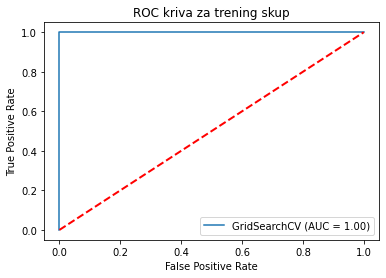

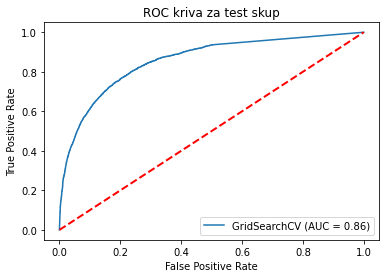

In [45]:
class_info(clf_knn,x_train, x_test, y_train, y_test, cv=True)


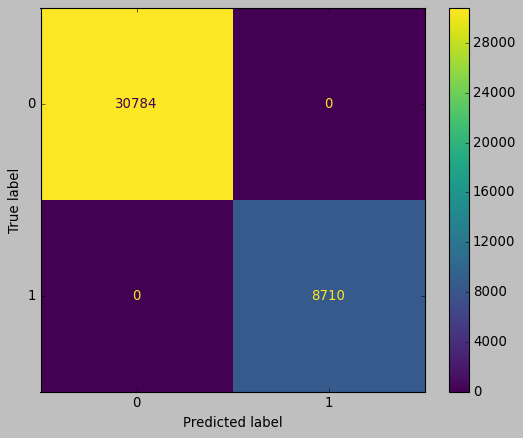

In [72]:
plot_confusion_matrix(clf_knn, x_train, y_train)

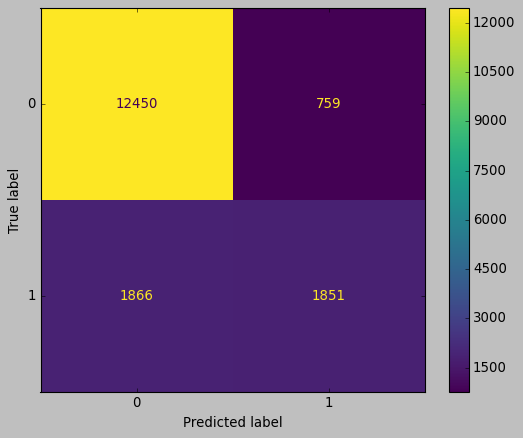

In [73]:
plot_confusion_matrix(clf_knn, x_test, y_test)

In [26]:
mlp = MLPClassifier()
mlp.fit(x_train,y_train)


MLPClassifier()

In [ ]:

mlp_accuracy = preciznost(mlp,x_test,y_test)
mlp_accuracy

##########################################
Trening skup:
Matrica konfuzije
       0     1
0  29072  1712
1   3845  4865
##########################################
Izvestaj klasifikacije
              precision    recall  f1-score   support

           0       0.88      0.94      0.91     30784
           1       0.74      0.56      0.64      8710

    accuracy                           0.86     39494
   macro avg       0.81      0.75      0.77     39494
weighted avg       0.85      0.86      0.85     39494

##########################################
Preciznost
0.859295082797387
##########################################
Test skup:
Matrica konfuzije
       0     1
0  11873  1336
1   1201  2516
##########################################
Izvestaj klasifikacije
              precision    recall  f1-score   support

           0       0.91      0.90      0.90     13209
           1       0.65      0.68      0.66      3717

    accuracy                           0.85     16926
   macro avg  

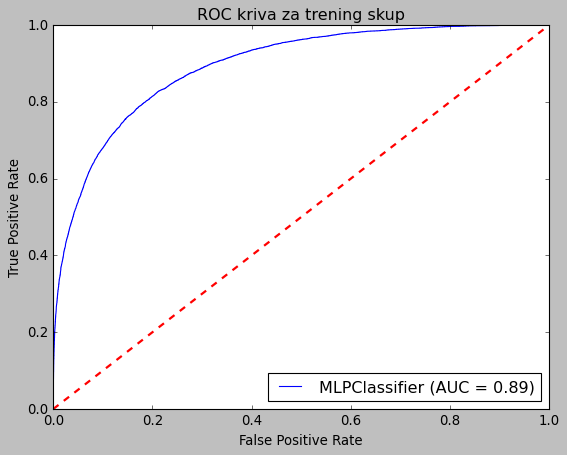

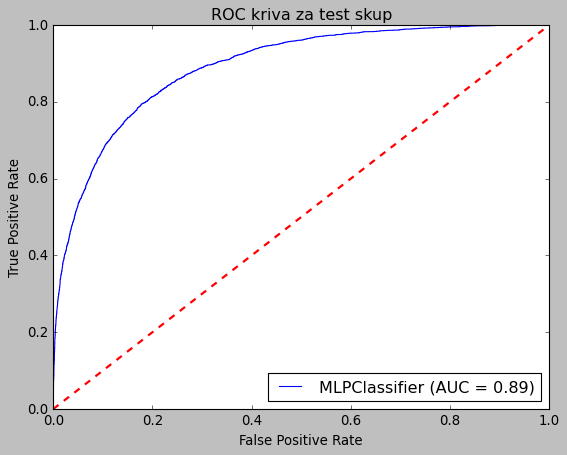

In [79]:
class_info(mlp,x_train, x_test, y_train, y_test)

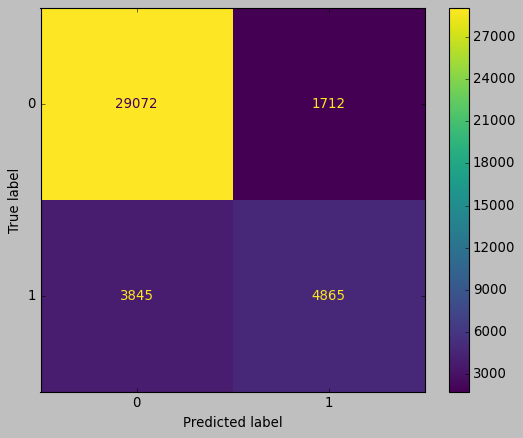

In [74]:
plot_confusion_matrix(mlp, x_train, y_train)

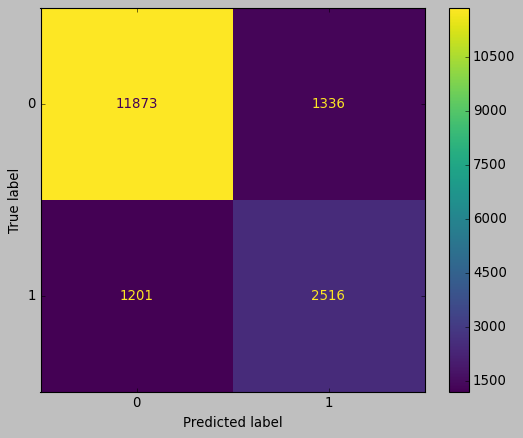

In [75]:
plot_confusion_matrix(mlp, x_test, y_test)

In [47]:
svc_classifier = SVC()
svc_classifier.fit(x_train, y_train)

svc_accuracy = preciznost(svc_classifier,x_test,y_test)
svc_accuracy

0.8541297412265154

##########################################
Trening skup:
Matrica konfuzije
       0     1
0  29689  1095
1   4609  4101
##########################################
Izvestaj klasifikacije
              precision    recall  f1-score   support

           0       0.87      0.96      0.91     30784
           1       0.79      0.47      0.59      8710

    accuracy                           0.86     39494
   macro avg       0.83      0.72      0.75     39494
weighted avg       0.85      0.86      0.84     39494

##########################################
Preciznost
0.8555729984301413
##########################################
Test skup:
Matrica konfuzije
       0     1
0  12549   660
1   1809  1908
##########################################
Izvestaj klasifikacije
              precision    recall  f1-score   support

           0       0.87      0.95      0.91     13209
           1       0.74      0.51      0.61      3717

    accuracy                           0.85     16926
   macro avg 

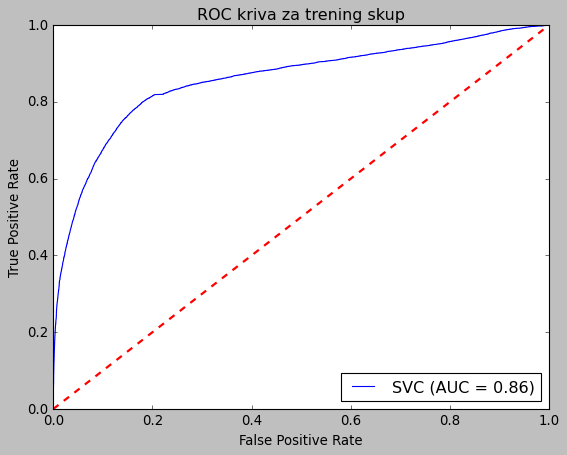

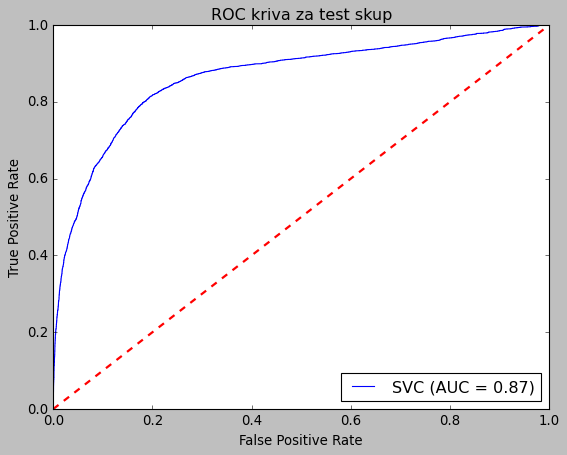

In [80]:
class_info(svc_classifier,x_train, x_test, y_train, y_test,cv=False)

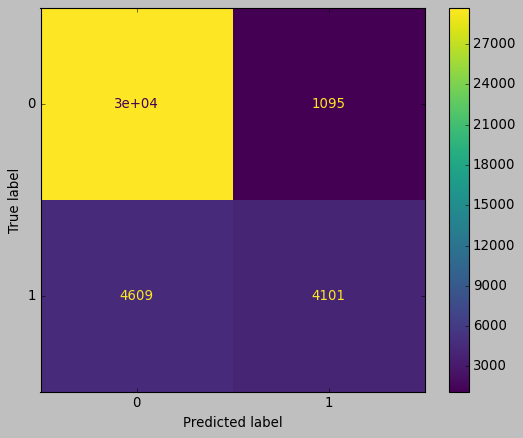

In [82]:
plot_confusion_matrix(svc_classifier, x_train, y_train)

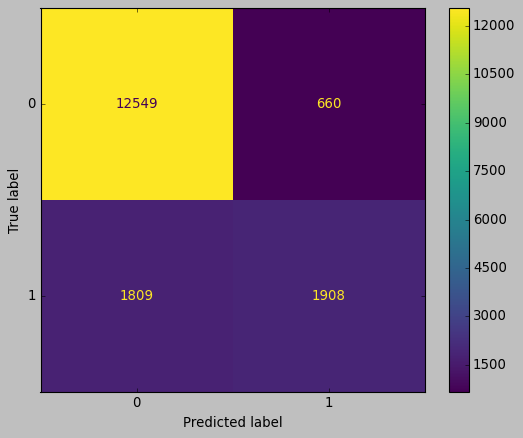

In [77]:
plot_confusion_matrix(svc_classifier, x_test, y_test)

# poredjenje





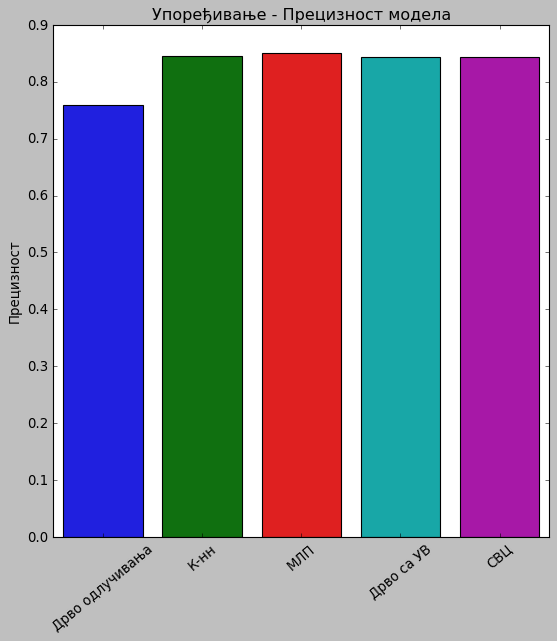

In [117]:
x = ["Дрво одлучивања", 
     "К-нн",
     "МЛП",
     "Дрво са УВ",
     "СВЦ"]



y = [dt_accuracy, 
    knn_accuracy,
     mlp_accuracy,
    clf_dtCV_accuracy,
     svc_accuracy]

plt.style.use("classic")
fig, ax = plt.subplots(figsize=(8,8))
sns.barplot(x=x,y=y);
plt.ylabel("Прецизност")
plt.xticks(rotation=40)
plt.title("Упоређивање - Прецизност модела");

In [102]:
params = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [3, 7, 11],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 3, 5],
    'random_state': [42]
}

clf_dtCV = GridSearchCV(dt, param_grid=params, cv=5)
clf_dtCV.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [3, 7, 11], 'min_samples_leaf': [1, 3, 5],
                         'min_samples_split': [2, 5, 10],
                         'random_state': [42]})

Najbolji parametri {'criterion': 'entropy', 'max_depth': 7, 'min_samples_leaf': 5, 'min_samples_split': 2, 'random_state': 42}
0.836 (+/-0.005) za {'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 2, 'random_state': 42}
0.836 (+/-0.005) za {'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 5, 'random_state': 42}
0.836 (+/-0.005) za {'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 10, 'random_state': 42}
0.836 (+/-0.005) za {'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 3, 'min_samples_split': 2, 'random_state': 42}
0.836 (+/-0.005) za {'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 3, 'min_samples_split': 5, 'random_state': 42}
0.836 (+/-0.005) za {'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 3, 'min_samples_split': 10, 'random_state': 42}
0.836 (+/-0.005) za {'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 5, 'min_samples_split': 2, 'random_state': 

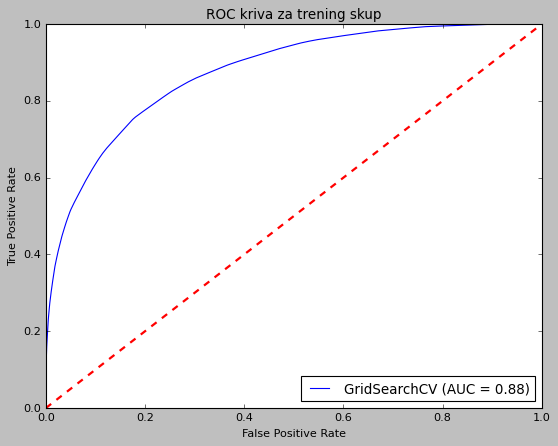

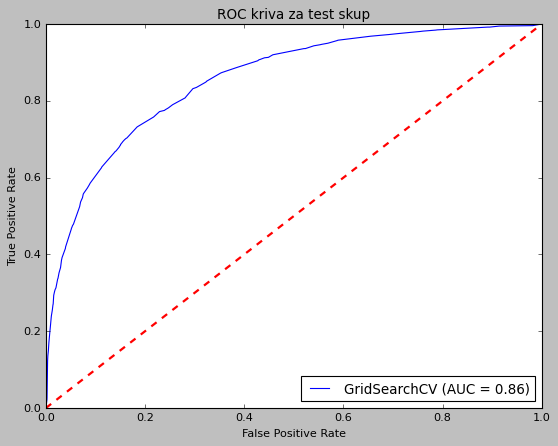

In [103]:
class_info(clf_gs,x_train, x_test, y_train, y_test,cv=True)

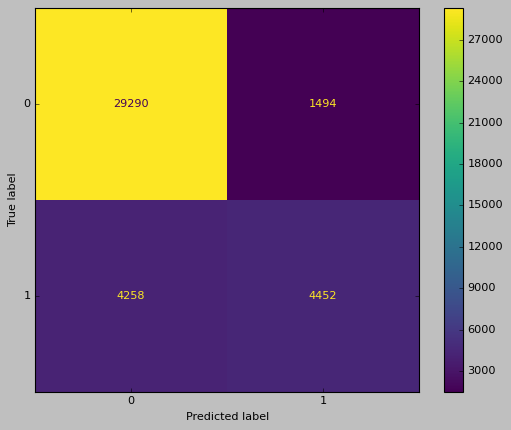

In [104]:
plot_confusion_matrix(clf_gs, x_train, y_train)

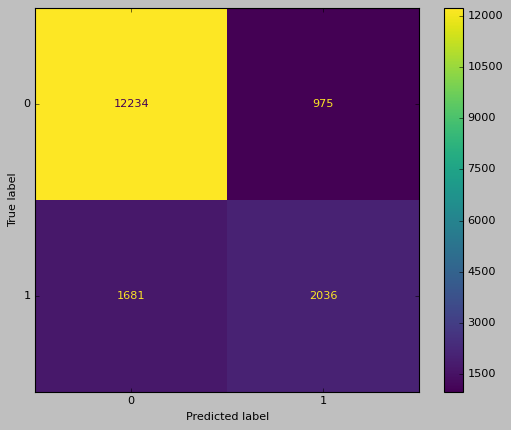

In [105]:
plot_confusion_matrix(clf_gs, x_test, y_test)

In [96]:
clf_dtCV_accuracy = preciznost(clf_gs,x_test,y_test)
clf_dtCV_accuracy

0.8429044074205364